### Set up

In [5]:
import os

import dotenv
from azure.identity import DefaultAzureCredential, get_bearer_token_provider
from azure.search.documents import SearchClient
from azure.search.documents.indexes import SearchIndexClient
from azure.search.documents.indexes.models import (
    HnswAlgorithmConfiguration,
    HnswParameters,
    SearchField,
    SearchFieldDataType,
    SearchIndex,
    SimpleField,
    VectorSearch,
    VectorSearchAlgorithmKind,
    VectorSearchProfile,
)
from azure.search.documents.models import VectorizedQuery



In [10]:
#dotenv.load_dotenv()
from dotenv import load_dotenv
load_dotenv('.env')

from azure.core.credentials import AzureKeyCredential
from azure.search.documents import SearchClient

AZURE_SEARCH_SERVICE = os.getenv("AZURE_SEARCH_SERVICE")
AZURE_SEARCH_ENDPOINT = f"https://{AZURE_SEARCH_SERVICE}.search.windows.net"
AZURE_SEARCH_IMAGES_INDEX = os.getenv("AZURE_SEARCH_IMAGES_INDEX")
AZURE_SEARCH_API_KEY = os.environ["AZURE_SEARCH_API_KEY"]

service_endpoint = AZURE_SEARCH_ENDPOINT
key = AZURE_SEARCH_API_KEY
index_name = AZURE_SEARCH_IMAGES_INDEX

search_client = SearchClient(service_endpoint, index_name, AzureKeyCredential(key))
azure_credential = DefaultAzureCredential(exclude_shared_token_cache_credential=True)

### Create search index for images

In [12]:
index = SearchIndex(
    name=AZURE_SEARCH_IMAGES_INDEX, 
    fields=[
        SimpleField(name="id", type=SearchFieldDataType.String, key=True),
        SimpleField(name="filename", type=SearchFieldDataType.String),
        SearchField(name="embedding", 
                    type=SearchFieldDataType.Collection(SearchFieldDataType.Single), 
                    searchable=True, 
                    vector_search_dimensions=1024,
                    vector_search_profile_name="embedding_profile")
    ],
    vector_search=VectorSearch(
        algorithms=[HnswAlgorithmConfiguration(
                            name="hnsw_config",
                            kind=VectorSearchAlgorithmKind.HNSW,
                            parameters=HnswParameters(metric="cosine"),
                        )],
        profiles=[VectorSearchProfile(name="embedding_profile", algorithm_configuration_name="hnsw_config")]
    )
)


index_client = SearchIndexClient(AZURE_SEARCH_ENDPOINT, AzureKeyCredential(key))
#index_client.create_index(index)
index_client.create_or_update_index

<bound method SearchIndexClient.create_or_update_index of <azure.search.documents.indexes._search_index_client.SearchIndexClient object at 0x1182675d0>>

### Configure Azure Computer Vision multi-modal embeddings API 

In [13]:
import mimetypes
import os

import requests
from PIL import Image

#see
#https://github.com/Azure-Samples/cognitive-services-quickstart-code/blob/master/python/ComputerVision/REST/python-analyze.md

token_provider = get_bearer_token_provider(azure_credential, "https://cognitiveservices.azure.com/.default")
AZURE_COMPUTERVISION_SERVICE = os.getenv("AZURE_COMPUTERVISION_SERVICE")


# Add your Computer Vision key and endpoint to your environment variables.
#if 'AZURE_COMPUTER_VISION_KEY' in os.environ:
#    subscription_key = os.environ['AZURE_COMPUTER_VISION_KEY']
#else:
#    print("\nSet the AZURE_COMPUTER_VISION_KEY environment variable.\n**Restart your shell or IDE for changes to take effect.**")
#    sys.exit()

subscription_key = os.getenv("AZURE_COMPUTER_VISION_KEY")


AZURE_COMPUTER_VISION_URL = f"https://{AZURE_COMPUTERVISION_SERVICE}.cognitiveservices.azure.com/computervision/retrieval"

def get_model_params():
    return {"api-version": "2023-02-01-preview", "modelVersion": "latest"}

def get_auth_headers():
    return {'Ocp-Apim-Subscription-Key': subscription_key}

def get_image_embedding(image_file):
    mimetype = mimetypes.guess_type(image_file)[0]
    url = f"{AZURE_COMPUTER_VISION_URL}:vectorizeImage"
    headers = get_auth_headers()
    headers["Content-Type"] = mimetype
    # add error checking
    response = requests.post(url, headers=headers, params=get_model_params(), data=open(image_file, "rb"))
    if response.status_code != 200:
        print(image_file, response.status_code, response.json())
    return response.json()["vector"]

def get_text_embedding(text):
    url = f"{AZURE_COMPUTER_VISION_URL}:vectorizeText"
    return requests.post(url, headers=get_auth_headers(), params=get_model_params(), json={"text": text}).json()["vector"]

### Add image vectors to search index

In [14]:
for image_file in os.listdir("product_images"):
    #todo fix access problem to get_image_embedding token
    image_embedding = get_image_embedding(f"product_images/{image_file}")
    search_client.upload_documents(documents=[{
        "id": image_file.split(".")[0],
        "filename": image_file,
        "embedding": image_embedding}])
    #}])

### Query using an image

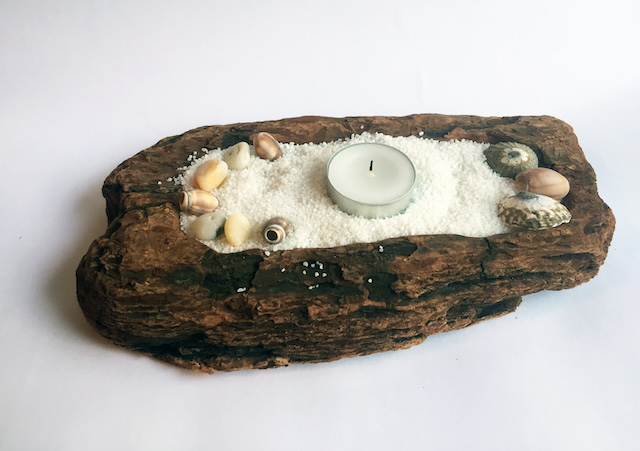

In [15]:
query_image = "query_images/tealightsand_side.jpg"
Image.open(query_image)

In [16]:
query_vector = get_image_embedding(query_image)
r = search_client.search(search_text=None, vector_queries=[
    VectorizedQuery(vector=query_vector, k_nearest_neighbors=3, fields="embedding")])
all = [doc["filename"] for doc in r]
for filename in all:
    print(filename)

tealightsand_night.jpg
singletealight1_side.jpg
doubletealight1_aboveside.jpg


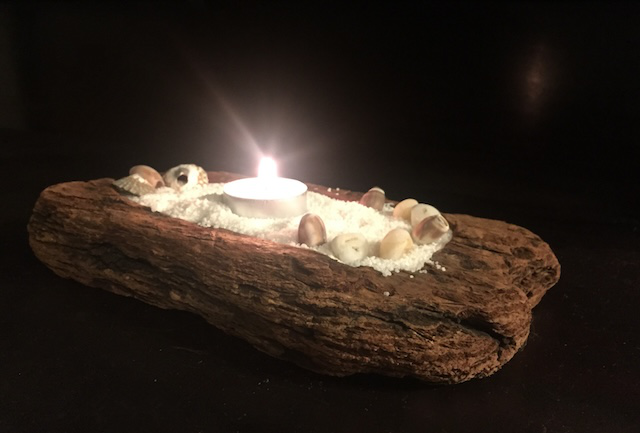

In [17]:
Image.open("product_images/" + all[0])

In [18]:
query_vector = get_text_embedding("aretes de plata")
r = search_client.search(None, vector_queries=[
    VectorizedQuery(vector=query_vector, k_nearest_neighbors=3, fields="embedding")])
all = [doc["filename"] for doc in r]
for filename in all:
    print(filename)

driftwoodearrings2_fullshot.jpg
driftwoodearrings3_front.jpg
driftwoodearrings1.jpg


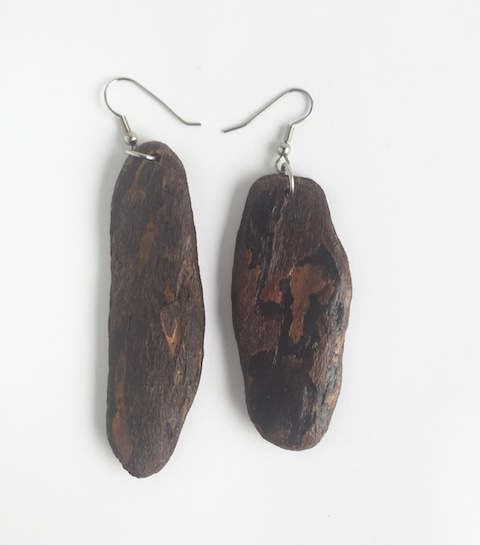

In [19]:
Image.open("product_images/" + all[0])

In [20]:
query_vector = get_text_embedding("lion king")
r = search_client.search(None, vector_queries=[
    VectorizedQuery(vector=query_vector, k_nearest_neighbors=3, fields="embedding")])
all = [doc["filename"] for doc in r]
for filename in all:
    print(filename)

hakunamatata_top.jpg
matatamagnet_fridge.jpg
sydneyOpera.jpeg


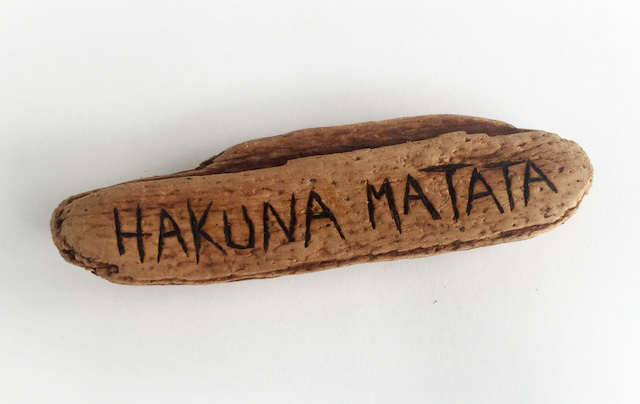

In [21]:
Image.open("product_images/" + all[0])

# Add 5360 images to the index


In [22]:
for image_file in os.listdir("images-5360/fruits/"):
    print(image_file)
    image_embedding = get_image_embedding(f"images-5360/fruits/{image_file}")
    search_client.upload_documents(documents=[{
        "id": image_file.split(".")[0],
        "filename": image_file,
        "embedding": image_embedding}])
    #}])

apples-royalty-free-image-164084111-1537885595.jpg
fresh-ripe-bananas.jpg
all-about-bananas.jpg
apples-101-about-1440x810.jpg
apple-3.jpeg
green-bananas.jpg
apples-close-up_screen.jpg
Bunch-of-bananas.jpg
bananas2.jpeg
apples-041efb2.jpg
Red_Apple.jpg


In [24]:
# query using an fruit image

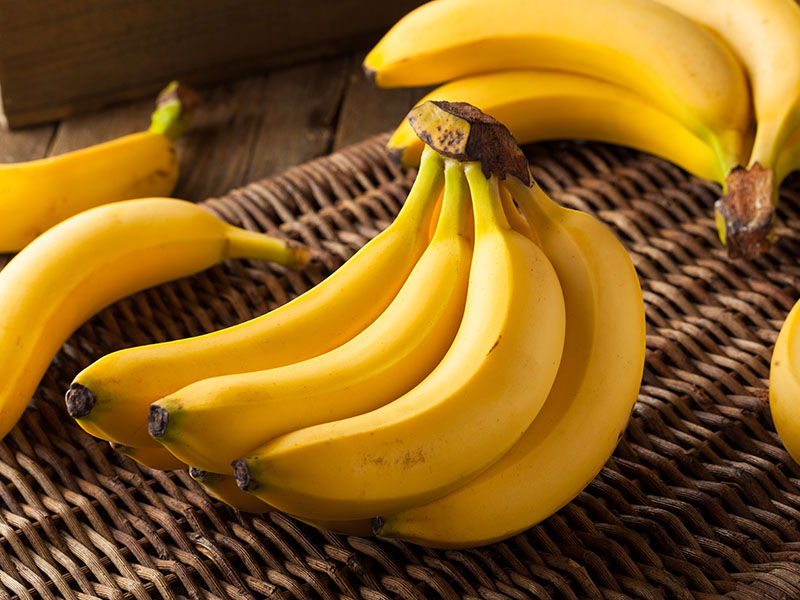

In [23]:
query_image = "images-5360/test/bananas.jpg"
Image.open(query_image)

In [24]:
query_vector = get_image_embedding(query_image)
r = search_client.search(search_text=None, vector_queries=[
    VectorizedQuery(vector=query_vector, k_nearest_neighbors=3, fields="embedding")])
all = [doc["filename"] for doc in r]
for filename in all:
    print(filename)

green-bananas.jpg
Bunch-of-bananas.jpg
fresh-ripe-bananas.jpg


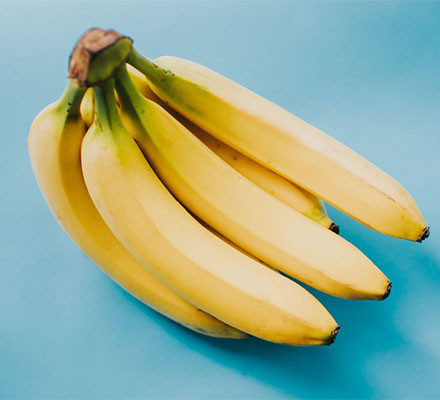

In [25]:
Image.open("images-5360/fruits/" + all[1])

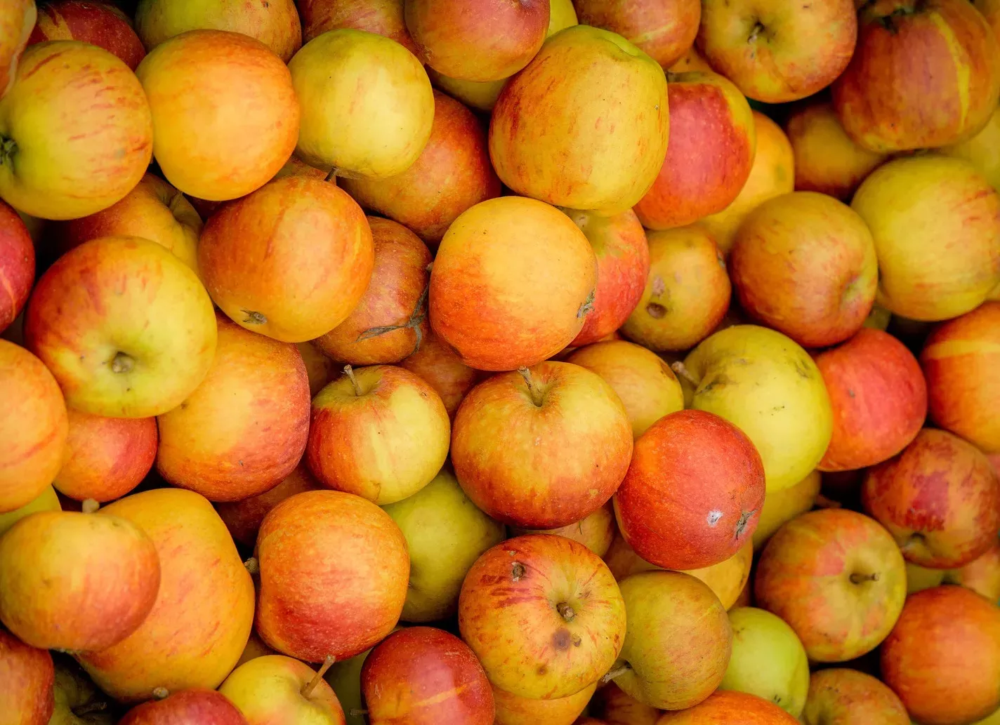

In [26]:
query_image = "images-5360/test/apple-header.jpg.jpeg"
Image.open(query_image)

In [27]:
query_vector = get_image_embedding(query_image)
r = search_client.search(search_text=None, vector_queries=[
    VectorizedQuery(vector=query_vector, k_nearest_neighbors=3, fields="embedding")])
all = [doc["filename"] for doc in r]
for filename in all:
    print(filename)

apples-royalty-free-image-164084111-1537885595.jpg
Red_Apple.jpg
apples-close-up_screen.jpg


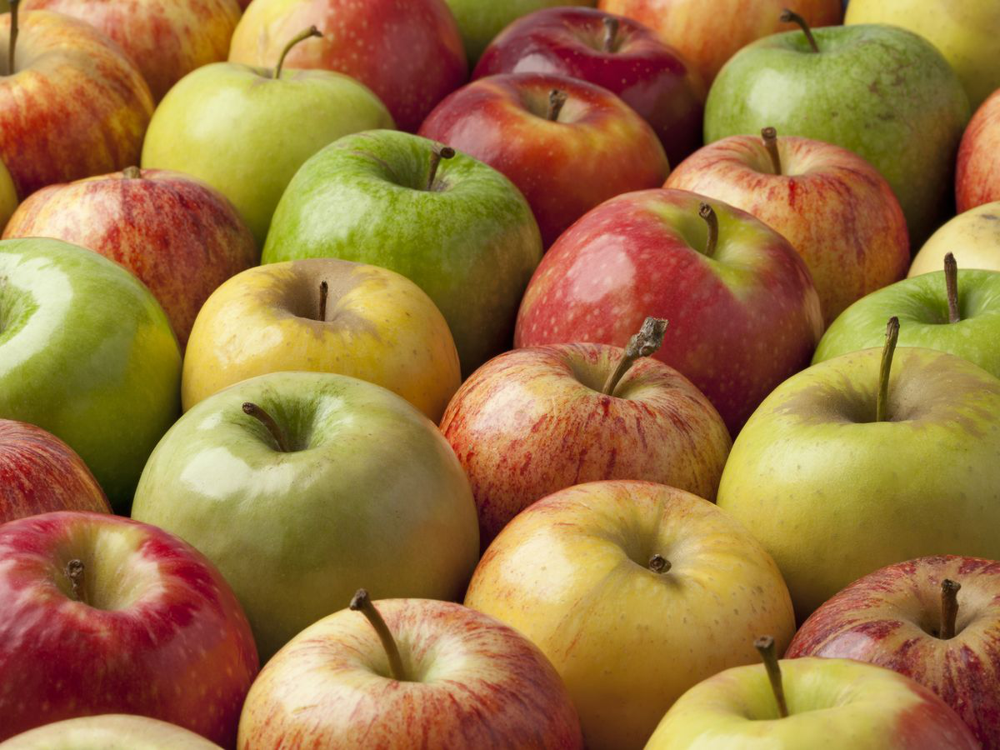

In [33]:
Image.open("images-5360/fruits/" + all[0])

In [28]:
query_vector = get_text_embedding("una manzana roja")
r = search_client.search(None, vector_queries=[
    VectorizedQuery(vector=query_vector, k_nearest_neighbors=3, fields="embedding")])
all = [doc["filename"] for doc in r]
for filename in all:
    print(filename)

Red_Apple.jpg
apples-close-up_screen.jpg
apples-101-about-1440x810.jpg


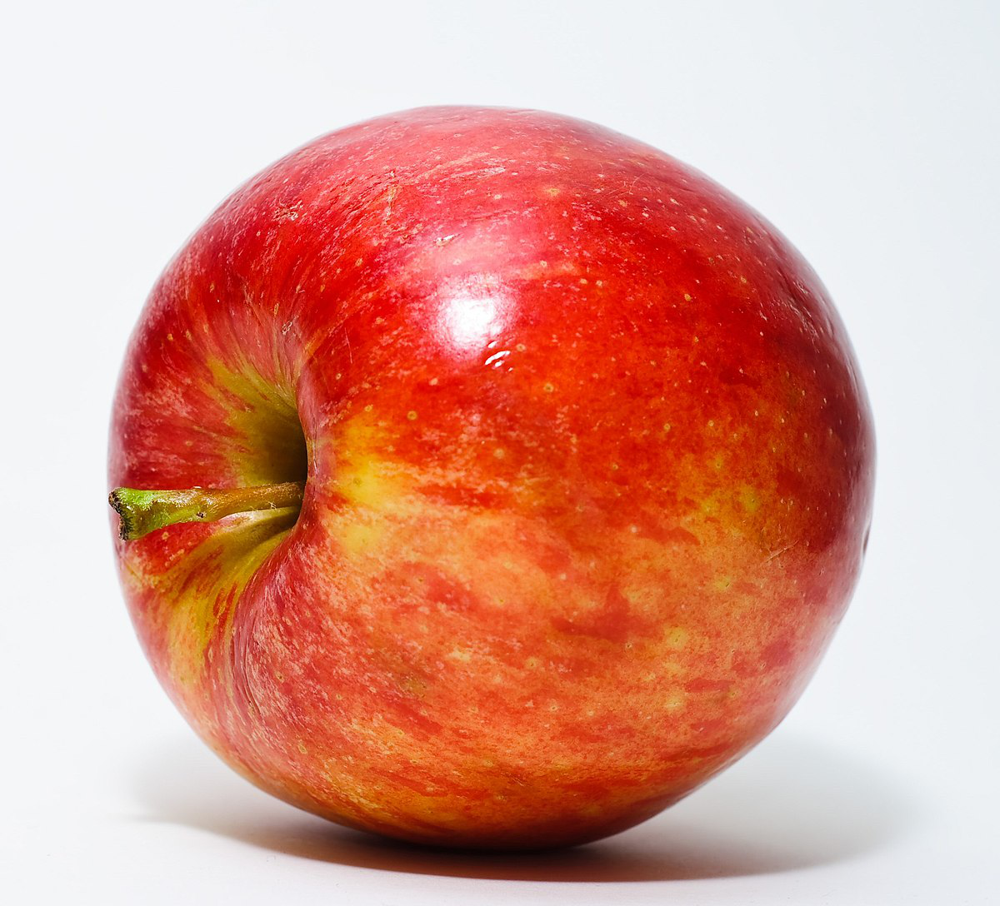

In [35]:
Image.open("images-5360/fruits/" + all[0])

In [30]:
for image_file in os.listdir("images-5360/sites/"):
    print(image_file)
    image_embedding = get_image_embedding(f"images-5360/sites/{image_file}")
    search_client.upload_documents(documents=[{
        "id": image_file.split(".")[0],
        "filename": image_file,
        "embedding": image_embedding}])

cuBoulder.jpeg
leeds4.jpeg
downtown.jpeg
450px-Broadway_and_Times_Square_by_night.jpg
tajMajal.jpeg
leeds2.jpeg
effeilTower.jpeg
pexels-photo-338515.jpeg
sydneyOpera.jpeg
piza.jpeg
leeds.jpeg
stone-edge.jpeg
denverMTC.jpeg
laIndependencia.jpeg
buckinhamPalace.jpeg


In [31]:
query_vector = get_text_embedding("winter wonderland")
r = search_client.search(None, vector_queries=[
    VectorizedQuery(vector=query_vector, k_nearest_neighbors=3, fields="embedding")])
all = [doc["filename"] for doc in r]
for filename in all:
    print(filename)

leeds4.jpeg
buckinhamPalace.jpeg
sydneyOpera.jpeg


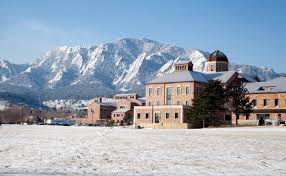

In [32]:
Image.open("images-5360/sites/" + all[0])